In [2]:
!pip install -U scikit-learn

     |████████████████████████████████| 6.8MB 18kB/s  eta 0:00:01     |▋                               | 122kB 1.5MB/s eta 0:00:05     |███████▏                        | 1.5MB 1.1MB/s eta 0:00:05     |████████████████████            | 4.3MB 1.1MB/s eta 0:00:03
ERROR: azureml-train-automl 1.0.72 has requirement onnxmltools==1.4.1, but you'll have onnxmltools 1.6.0 which is incompatible.
ERROR: azureml-train-automl 1.0.72 has requirement scikit-learn<=0.20.3,>=0.19.0, but you'll have scikit-learn 0.23.2 which is incompatible.
ERROR: azureml-automl-core 1.0.72.1 has requirement onnxmltools==1.4.1, but you'll have onnxmltools 1.6.0 which is incompatible.
ERROR: azureml-automl-core 1.0.72.1 has requirement scikit-learn<=0.20.3,>=0.19.0, but you'll have scikit-learn 0.23.2 which is incompatible.
  Found existing installation: scikit-learn 0.20.3
    Uninstalling scikit-learn-0.20.3:
      Successfully uninstalled scikit-learn-0.20.3
You should consider upgrading via the 'pip install --upgrad

In [3]:
import sklearn
format(sklearn.__version__)

'0.20.3'

In [4]:
!pip install lifetimes
!pip install -U yellowbrick

  Using cached yellowbrick-1.1-py3-none-any.whl (263 kB)
  Using cached matplotlib-3.3.1-cp36-cp36m-manylinux1_x86_64.whl (11.6 MB)
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.0.0
    Uninstalling matplotlib-3.0.0:
      Successfully uninstalled matplotlib-3.0.0


In [3]:
! pip install certifi --ignore-installed

  Using cached certifi-2020.6.20-py2.py3-none-any.whl (156 kB)
ERROR: After October 2020 you may experience errors when installing or updating packages. This is because pip will change the way that it resolves dependency conflicts.

We recommend you use --use-feature=2020-resolver to test your packages with the new resolver before it becomes the default.

papermill 1.2.1 requires tqdm>=4.32.2, but you'll have tqdm 4.26.0 which is incompatible.
okpy 1.13.11 requires requests==2.12.4, but you'll have requests 2.22.0 which is incompatible.


In [3]:
!pip install --upgrade pip

     |████████████████████████████████| 1.5MB 1.2MB/s eta 0:00:01
  Found existing installation: pip 19.3.1
    Uninstalling pip-19.3.1:
      Successfully uninstalled pip-19.3.1


In [2]:
import pandas as pd
import numpy as np
import math
import json
import seaborn as sns
import datetime
import utilities as t
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics

from yellowbrick.cluster.elbow import kelbow_visualizer

from lifetimes.utils import summary_data_from_transaction_data

In [3]:
import sklearn
from sklearn.cluster import OPTICS

In [4]:
# json dosyalarının okunması
portfolio = pd.read_json('portfolio.json', orient='records', lines=True)

In [5]:
print(portfolio.shape)
portfolio.head()

(10, 6)


,reward,channels,difficulty,duration,offer_type,id
0,10,"[email, mobile, social]",10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd
1,10,"[web, email, mobile, social]",10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0
2,0,"[web, email, mobile]",0,4,informational,3f207df678b143eea3cee63160fa8bed
3,5,"[web, email, mobile]",5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9
4,5,"[web, email]",20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7


In [6]:
profile = pd.read_json('profile.json', orient='records', lines=True)

In [7]:
print(profile.shape)
profile.head()

(17000, 5)


,gender,age,id,became_member_on,income
0,None,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,NaN
1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.0
2,None,118,38fe809add3b4fcf9315a9694bb96ff5,20180712,NaN
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,20170509,100000.0
4,None,118,a03223e636434f42ac4c3df47e8bac43,20170804,NaN


In [8]:
transcript = pd.read_json('transcript.json', orient='records', lines=True)

In [9]:
print(transcript.shape)
transcript.head()

(306534, 4)


,person,event,value,time
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0


In [10]:
# profile veri seti gender sutununda bos alanlarin doldurulmasi
profile['gender'] = profile['gender'].fillna('NA')

In [11]:
#Unique cinsiyetlerin ögrenilmesi
print('Unique genders:')
print(profile['gender'].unique())

Unique genders:
['NA' 'F' 'M' 'O']


In [12]:
# became_member_on sutunundaki tarihleri datetime'a cevirme
profile['became_member_on'] = pd.to_datetime(profile['became_member_on'], format='%Y%m%d')

In [13]:
print('Yas ve gelir için istatistikler:')
print(profile.describe())

Yas ve gelir için istatistikler:
                age         income
count  17000.000000   14825.000000
mean      62.531412   65404.991568
std       26.738580   21598.299410
min       18.000000   30000.000000
25%       45.000000   49000.000000
50%       58.000000   64000.000000
75%       73.000000   80000.000000
max      118.000000  120000.000000


In [14]:
#event sutununda unique degerlerin gosterilmesi
print('Unique event tipleri:')
print(transcript['event'].unique())

Unique event tipleri:
['offer received' 'offer viewed' 'transaction' 'offer completed']


In [15]:
print('Time sutunu için istatistikler:')
print(transcript.describe())

Time sutunu için istatistikler:
                time
count  306534.000000
mean      366.382940
std       200.326314
min         0.000000
25%       186.000000
50%       408.000000
75%       528.000000
max       714.000000


In [16]:
#income sutununda eksik degerlerin doldurulmasi
profile['income_na'] = profile['income'].isna().astype(int)
profile['income'] = profile['income'].fillna(profile['income'].mean())

In [17]:
profile.head(10)

,gender,age,id,became_member_on,income,income_na
0,NA,118,68be06ca386d4c31939f3a4f0e3dd783,2017-02-12,65404.991568,1
1,F,55,0610b486422d4921ae7d2bf64640c50b,2017-07-15,112000.000000,0
2,NA,118,38fe809add3b4fcf9315a9694bb96ff5,2018-07-12,65404.991568,1
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,2017-05-09,100000.000000,0
4,NA,118,a03223e636434f42ac4c3df47e8bac43,2017-08-04,65404.991568,1
5,M,68,e2127556f4f64592b11af22de27a7932,2018-04-26,70000.000000,0
6,NA,118,8ec6ce2a7e7949b1bf142def7d0e0586,2017-09-25,65404.991568,1
7,NA,118,68617ca6246f4fbc85e91a2a49552598,2017-10-02,65404.991568,1
8,M,65,389bc3fa690240e798340f5a15918d5c,2018-02-09,53000.000000,0
9,NA,118,8974fc5686fe429db53ddde067b88302,2016-11-22,65404.991568,1


In [18]:
#channel sutununda one-hot-encoding islemi gerçeklestirilir.
# MultilabelBinarizer ornek basina birden cok etiketi kodlamaya olanak tanir. 
#Ortaya çikan diziyi çevirmek için, bu dizi ve kodlanmis siniflarla bir DataFrame olusturulur.
lb = MultiLabelBinarizer()
channel_dummies = pd.DataFrame(lb.fit_transform(portfolio['channels']), columns=lb.classes_, index=portfolio.index)

In [19]:
# offer type sutunu yapay degisken olusturma
offer_type_dummies = portfolio['offer_type'].str.get_dummies()

portfolio = pd.concat([portfolio, channel_dummies, offer_type_dummies], axis=1)


portfolio.head()

,reward,channels,difficulty,duration,offer_type,id,email,mobile,social,web,bogo,discount,informational
0,10,"[email, mobile, social]",10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0,1,0,0
1,10,"[web, email, mobile, social]",10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1,1,0,0
2,0,"[web, email, mobile]",0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1,0,0,1
3,5,"[web, email, mobile]",5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1,1,0,0
4,5,"[web, email]",20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1,0,1,0


In [20]:
# gender sutunu yapay degisken olusturma

profile['became_member'] = profile['became_member_on'].apply(lambda x: str(x.year))

gender_dumm = profile['gender'].str.get_dummies().add_prefix('gender_')
year_joined_dumm = profile['became_member'].str.get_dummies().add_prefix('became_member_year_')

profile = pd.concat([profile, gender_dumm, year_joined_dumm], axis=1)
#Eski sutunlarin kaldirilmasi
profile.drop(['became_member_on'], axis=1, inplace=True)
profile.drop(['became_member'], axis=1, inplace=True)

profile.head()

,gender,age,id,income,income_na,gender_F,gender_M,gender_NA,gender_O,became_member_year_2013,became_member_year_2014,became_member_year_2015,became_member_year_2016,became_member_year_2017,became_member_year_2018
0,NA,118,68be06ca386d4c31939f3a4f0e3dd783,65404.991568,1,0,0,1,0,0,0,0,0,1,0
1,F,55,0610b486422d4921ae7d2bf64640c50b,112000.000000,0,1,0,0,0,0,0,0,0,1,0
2,NA,118,38fe809add3b4fcf9315a9694bb96ff5,65404.991568,1,0,0,1,0,0,0,0,0,0,1
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,100000.000000,0,1,0,0,0,0,0,0,0,1,0
4,NA,118,a03223e636434f42ac4c3df47e8bac43,65404.991568,1,0,0,1,0,0,0,0,0,1,0


In [21]:
# transaction veri seti event sutunu yapay degisken olusturma
event_dumm = transcript['event'].str.get_dummies()
event_dumm.drop('transaction', axis=1, inplace=True)

transcript = pd.concat([transcript, event_dumm], axis=1)
transcript.rename(columns={'offer completed': 'offer_completed', 'offer received': 'offer_received', 'offer viewed': 'offer_viewed'}, inplace=True)


transcript.head()

,person,event,value,time,offer_completed,offer_received,offer_viewed
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0,0,1,0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0,0,1,0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0,0,1,0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0,0,1,0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0,0,1,0


In [22]:
#offer ve transaction dataframelerini ayirma





transactions = transcript.query('event == "transaction"').copy()
transactions['amount'] = transactions['value'].apply(lambda x: list(x.values())[0])
transactions.drop(['value', 'offer_completed', 'offer_received', 'offer_viewed'], axis=1, inplace=True)

offers = transcript.query('event != "transaction"').copy()
offers['offer_id'] = offers['value'].apply(lambda x: list(x.values())[0])
offers.drop(['value'], axis=1, inplace=True)

In [23]:
portfolio.head()

,reward,channels,difficulty,duration,offer_type,id,email,mobile,social,web,bogo,discount,informational
0,10,"[email, mobile, social]",10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0,1,0,0
1,10,"[web, email, mobile, social]",10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1,1,0,0
2,0,"[web, email, mobile]",0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1,0,0,1
3,5,"[web, email, mobile]",5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1,1,0,0
4,5,"[web, email]",20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1,0,1,0


In [24]:
profile.head()

,gender,age,id,income,income_na,gender_F,gender_M,gender_NA,gender_O,became_member_year_2013,became_member_year_2014,became_member_year_2015,became_member_year_2016,became_member_year_2017,became_member_year_2018
0,NA,118,68be06ca386d4c31939f3a4f0e3dd783,65404.991568,1,0,0,1,0,0,0,0,0,1,0
1,F,55,0610b486422d4921ae7d2bf64640c50b,112000.000000,0,1,0,0,0,0,0,0,0,1,0
2,NA,118,38fe809add3b4fcf9315a9694bb96ff5,65404.991568,1,0,0,1,0,0,0,0,0,0,1
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,100000.000000,0,1,0,0,0,0,0,0,0,1,0
4,NA,118,a03223e636434f42ac4c3df47e8bac43,65404.991568,1,0,0,1,0,0,0,0,0,1,0


In [25]:
transcript.head()

,person,event,value,time,offer_completed,offer_received,offer_viewed
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0,0,1,0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0,0,1,0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0,0,1,0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0,0,1,0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0,0,1,0


In [26]:
offers = offers.merge(profile, left_on='person', right_on='id')
offers = offers.merge(portfolio, left_on='offer_id', right_on='id')
offers.drop(['id_x', 'id_y'], axis=1, inplace=True)
offers.set_index('offer_id', inplace=True)
offers.head()

,person,event,time,offer_completed,offer_received,offer_viewed,gender,age,income,income_na,...,difficulty,duration,offer_type,email,mobile,social,web,bogo,discount,informational
offer_id,,,,,,,,,,,,,,,,,,,,,
9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,0,1,0,F,75,100000.0,0,...,5,7,bogo,1,1,0,1,1,0,0
9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer viewed,6,0,0,1,F,75,100000.0,0,...,5,7,bogo,1,1,0,1,1,0,0
9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer completed,132,1,0,0,F,75,100000.0,0,...,5,7,bogo,1,1,0,1,1,0,0
9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer received,408,0,1,0,M,68,70000.0,0,...,5,7,bogo,1,1,0,1,1,0,0
9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer viewed,420,0,0,1,M,68,70000.0,0,...,5,7,bogo,1,1,0,1,1,0,0


In [27]:
transactions = transactions.merge(profile, left_on='person', right_on='id')
transactions.drop(['event'], axis=1, inplace=True)
transactions.head()

,person,time,amount,gender,age,id,income,income_na,gender_F,gender_M,gender_NA,gender_O,became_member_year_2013,became_member_year_2014,became_member_year_2015,became_member_year_2016,became_member_year_2017,became_member_year_2018
0,02c083884c7d45b39cc68e1314fec56c,0,0.83,F,20,02c083884c7d45b39cc68e1314fec56c,30000.0,0,1,0,0,0,0,0,0,1,0,0
1,02c083884c7d45b39cc68e1314fec56c,6,1.44,F,20,02c083884c7d45b39cc68e1314fec56c,30000.0,0,1,0,0,0,0,0,0,1,0,0
2,02c083884c7d45b39cc68e1314fec56c,12,4.56,F,20,02c083884c7d45b39cc68e1314fec56c,30000.0,0,1,0,0,0,0,0,0,1,0,0
3,02c083884c7d45b39cc68e1314fec56c,84,1.53,F,20,02c083884c7d45b39cc68e1314fec56c,30000.0,0,1,0,0,0,0,0,0,1,0,0
4,02c083884c7d45b39cc68e1314fec56c,90,0.50,F,20,02c083884c7d45b39cc68e1314fec56c,30000.0,0,1,0,0,0,0,0,0,1,0,0


In [28]:
#Tekrarlanan offer degerlerinin tespit edilmesi
offers.reset_index(inplace=True)

In [29]:
#Ayni teklif birden cok kez alinabilir ve goruntulenebilir
offers[offers.duplicated(subset=['offer_id', 'person'], keep=False)].head()

,offer_id,person,event,time,offer_completed,offer_received,offer_viewed,gender,age,income,...,difficulty,duration,offer_type,email,mobile,social,web,bogo,discount,informational
0,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,0,1,0,F,75,100000.0,...,5,7,bogo,1,1,0,1,1,0,0
1,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer viewed,6,0,0,1,F,75,100000.0,...,5,7,bogo,1,1,0,1,1,0,0
2,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer completed,132,1,0,0,F,75,100000.0,...,5,7,bogo,1,1,0,1,1,0,0
3,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer received,408,0,1,0,M,68,70000.0,...,5,7,bogo,1,1,0,1,1,0,0
4,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer viewed,420,0,0,1,M,68,70000.0,...,5,7,bogo,1,1,0,1,1,0,0


In [30]:
#received time, viewed time ve completed time sütunları eklenir
offers['time'] = offers['time'] + 0.5
offers['received_time'] = offers['offer_received'] * offers['time']
offers['viewed_time'] = offers['offer_viewed'] * offers['time']
offers['completed_time'] = offers['offer_completed'] * offers['time']
offers.head()

,offer_id,person,event,time,offer_completed,offer_received,offer_viewed,gender,age,income,...,email,mobile,social,web,bogo,discount,informational,received_time,viewed_time,completed_time
0,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer received,0.5,0,1,0,F,75,100000.0,...,1,1,0,1,1,0,0,0.5,0.0,0.0
1,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer viewed,6.5,0,0,1,F,75,100000.0,...,1,1,0,1,1,0,0,0.0,6.5,0.0
2,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer completed,132.5,1,0,0,F,75,100000.0,...,1,1,0,1,1,0,0,0.0,0.0,132.5
3,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer received,408.5,0,1,0,M,68,70000.0,...,1,1,0,1,1,0,0,408.5,0.0,0.0
4,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer viewed,420.5,0,0,1,M,68,70000.0,...,1,1,0,1,1,0,0,0.0,420.5,0.0


In [31]:
#Bir teklif aynı kisi tarafindan birden cok kez alınabilir
offers_mins = offers.groupby(['person', 'offer_id', 'event']).min()
offers_sums = offers.groupby(['person', 'offer_id', 'event'])[['offer_received', 'offer_viewed', 'offer_completed']].sum()

offers_mins.update(offers_sums)

offers_grouped = offers_mins.groupby(['person', 'offer_id']).max().reset_index()

offers_grouped.fillna(0, inplace=True)

offers_grouped.head()

,person,offer_id,time,offer_completed,offer_received,offer_viewed,gender,age,income,income_na,...,email,mobile,social,web,bogo,discount,informational,received_time,viewed_time,completed_time
0,0009655768c64bdeb2e877511632db8f,2906b810c7d4411798c6938adc9daaa5,576.5,1,1,0,M,33,72000.0,0,...,1,1,0,1,0,1,0,576.5,0.0,576.5
1,0009655768c64bdeb2e877511632db8f,3f207df678b143eea3cee63160fa8bed,372.5,0,1,1,M,33,72000.0,0,...,1,1,0,1,0,0,1,336.5,372.5,0.0
2,0009655768c64bdeb2e877511632db8f,5a8bc65990b245e5a138643cd4eb9837,192.5,0,1,1,M,33,72000.0,0,...,1,1,1,0,0,0,1,168.5,192.5,0.0
3,0009655768c64bdeb2e877511632db8f,f19421c1d4aa40978ebb69ca19b0e20d,456.5,1,1,1,M,33,72000.0,0,...,1,1,1,1,1,0,0,408.5,456.5,414.5
4,0009655768c64bdeb2e877511632db8f,fafdcd668e3743c1bb461111dcafc2a4,540.5,1,1,1,M,33,72000.0,0,...,1,1,1,1,0,1,0,504.5,540.5,528.5


In [32]:
#Tekliflerle alakalı anlamsiz degerler kaldirilmistir. Ornek olarak; goruntulemeden tamamlama, goruntulemeden once tamamlama veya teslim almadan once goruntuleme gibi
offers_grouped['end_time'] = offers_grouped['received_time'] + offers_grouped['duration'] * 24
offers_grouped['viewed_on_time'] = offers_grouped.apply(lambda x: 1 if x['viewed_time'] < x['end_time'] and x['viewed_time'] != 0 else 0, axis=1)
offers_grouped['completed_on_time'] = offers_grouped.apply(lambda x: 1 if x['completed_time'] < x['end_time'] and x['completed_time'] != 0 else 0, axis=1)


offers_grouped = offers_grouped.query('~(completed_time > 0 and viewed_time == 0)')
offers_grouped = offers_grouped.query('~(completed_time != 0 and completed_time < viewed_time)')
offers_grouped = offers_grouped.query('~(viewed_time != 0 and viewed_time < received_time)')

In [33]:
# time sutunları datetime' a donusturulur
transactions['datetime'] = transactions['time'].apply(lambda x:pd.Timestamp('2000-01-01T12') + pd.Timedelta(hours=x))
transactions.head()

refre = summary_data_from_transaction_data(transactions, 'person', 'datetime', monetary_value_col='amount')
refre.drop('T', axis=1, inplace=True)

profile.rename({'id': 'person'}, axis=1, inplace=True)
profile.set_index('person', inplace=True)

buyers = profile.join(refre)

In [34]:
buyers.head()

,gender,age,income,income_na,gender_F,gender_M,gender_NA,gender_O,became_member_year_2013,became_member_year_2014,became_member_year_2015,became_member_year_2016,became_member_year_2017,became_member_year_2018,frequency,recency,monetary_value
person,,,,,,,,,,,,,,,,,
68be06ca386d4c31939f3a4f0e3dd783,NA,118,65404.991568,1,0,0,1,0,0,0,0,0,1,0,8.0,14.0,2.50625
0610b486422d4921ae7d2bf64640c50b,F,55,112000.000000,0,1,0,0,0,0,0,0,0,1,0,2.0,21.0,27.75000
38fe809add3b4fcf9315a9694bb96ff5,NA,118,65404.991568,1,0,0,1,0,0,0,0,0,0,1,5.0,23.0,2.59200
78afa995795e4d85b5d9ceeca43f5fef,F,75,100000.000000,0,1,0,0,0,0,0,0,0,1,0,5.0,16.0,24.32000
a03223e636434f42ac4c3df47e8bac43,NA,118,65404.991568,1,0,0,1,0,0,0,0,0,1,0,2.0,16.0,1.78000


In [35]:
def mean_zero(x):
    return x.replace(0, np.nan).mean() 

def sum_zero(x):
    return (x > 0).sum()

In [36]:
# indirim teklifleri goruntuleme oranı
discount_perf = offers_grouped.query('offer_type == "discount"').groupby(['person']).agg(
    offers_rec_cnt = ('offer_received', sum_zero),
    offers_vie_cnt = ('offer_viewed', sum_zero),
    offers_comp_cnt = ('offer_completed', sum_zero),    
)
discount_perf['discount_vr'] = discount_perf['offers_vie_cnt'] / discount_perf['offers_rec_cnt']
discount_perf['discount_cr'] = discount_perf['offers_comp_cnt'] / discount_perf['offers_vie_cnt']
discount_perf.drop(['offers_vie_cnt', 'offers_rec_cnt', 'offers_comp_cnt'], axis=1, inplace=True)


In [37]:
# BOGO teklifleri goruntuleme oranı
bogo_perf = offers_grouped.query('offer_type == "bogo"').groupby(['person']).agg(
    offers_rec_cnt = ('offer_received', sum_zero),
    offers_vie_cnt = ('offer_viewed', sum_zero),
    offers_comp_cnt = ('offer_completed', sum_zero),    
)
bogo_perf['bogo_vr'] = bogo_perf['offers_vie_cnt'] / bogo_perf['offers_rec_cnt']
bogo_perf['bogo_cr'] = bogo_perf['offers_comp_cnt'] / bogo_perf['offers_vie_cnt']
bogo_perf.drop(['offers_vie_cnt', 'offers_rec_cnt', 'offers_comp_cnt'], axis=1, inplace=True)

In [38]:
# Bilgilendirme teklifleri goruntuleme oranı
informational_perf = offers_grouped.query('offer_type == "informational"').groupby(['person']).agg(
    offers_rec_cnt = ('offer_received', sum_zero),
    offers_vie_cnt = ('offer_viewed', sum_zero),
    offers_comp_cnt = ('offer_completed', sum_zero),    
)
informational_perf['informational_vr'] = informational_perf['offers_vie_cnt'] / informational_perf['offers_rec_cnt']
informational_perf.drop(['offers_vie_cnt', 'offers_rec_cnt', 'offers_comp_cnt'], axis=1, inplace=True)

In [39]:
# Tum tekliflerin donusum oranları
total_perf = offers_grouped.query('offer_type != "informational"').groupby(['person']).agg(
    offers_rec_cnt = ('offer_received', sum_zero),
    offers_vie_cnt = ('offer_viewed', sum_zero),
    offers_comp_cnt = ('offer_completed', sum_zero),    
)
total_perf['total_cr'] = total_perf['offers_comp_cnt'] / total_perf['offers_vie_cnt']
total_perf.drop(['offers_vie_cnt', 'offers_rec_cnt', 'offers_comp_cnt'], axis=1, inplace=True)

In [40]:
buyers = buyers.join(discount_perf).join(bogo_perf).join(total_perf).join(informational_perf)
buyers.fillna(0, inplace=True)
buyers.head()

,gender,age,income,income_na,gender_F,gender_M,gender_NA,gender_O,became_member_year_2013,became_member_year_2014,...,became_member_year_2018,frequency,recency,monetary_value,discount_vr,discount_cr,bogo_vr,bogo_cr,total_cr,informational_vr
person,,,,,,,,,,,,,,,,,,,,,
68be06ca386d4c31939f3a4f0e3dd783,NA,118,65404.991568,1,0,0,1,0,0,0,...,0,8.0,14.0,2.50625,1.0,0.5,0.0,0.0,0.5,0.0
0610b486422d4921ae7d2bf64640c50b,F,55,112000.000000,0,1,0,0,0,0,0,...,0,2.0,21.0,27.75000,0.0,0.0,0.0,0.0,0.0,0.0
38fe809add3b4fcf9315a9694bb96ff5,NA,118,65404.991568,1,0,0,1,0,0,0,...,1,5.0,23.0,2.59200,0.0,0.0,1.0,0.0,0.0,1.0
78afa995795e4d85b5d9ceeca43f5fef,F,75,100000.000000,0,1,0,0,0,0,0,...,0,5.0,16.0,24.32000,0.0,0.0,1.0,1.0,1.0,1.0
a03223e636434f42ac4c3df47e8bac43,NA,118,65404.991568,1,0,0,1,0,0,0,...,0,2.0,16.0,1.78000,1.0,0.0,0.0,0.0,0.0,0.5


In [41]:
#Musteri tekliflerinin toplanmasi
buyers_offers = offers_grouped.groupby('person').agg(
    bogo_cnt = ('bogo', 'sum'),
    discount_cnt = ('discount', 'sum'),
    informational_cnt = ('informational', 'sum'),
    reward_avg = ('reward', 'mean'),
    difficulty_avg = ('difficulty', 'mean'),
    email_cnt = ('email', 'sum'),
    mobile_cnt = ('mobile', 'sum'),
    social_cnt = ('social', 'sum'),
    web_cnt = ('web', 'sum'),
    exposures_rec_avg = ('offer_received', 'mean'),
    exposures_vie_avg = ('offer_viewed', 'mean'),
    exposures_comp_avg = ('offer_completed', 'mean'),
    offers_rec_cnt = ('offer_received', sum_zero),
    offers_vie_cnt = ('offer_viewed', sum_zero),
    offers_comp_cnt = ('offer_completed', sum_zero),
)

buyers = buyers.join(buyers_offers)

buyers.drop(['gender', 'gender_NA', 'income_na'], axis=1, inplace=True)
buyers.dropna(inplace=True)

buyers.head()

,age,income,gender_F,gender_M,gender_O,became_member_year_2013,became_member_year_2014,became_member_year_2015,became_member_year_2016,became_member_year_2017,...,email_cnt,mobile_cnt,social_cnt,web_cnt,exposures_rec_avg,exposures_vie_avg,exposures_comp_avg,offers_rec_cnt,offers_vie_cnt,offers_comp_cnt
person,,,,,,,,,,,,,,,,,,,,,
68be06ca386d4c31939f3a4f0e3dd783,118,65404.991568,0,0,0,0,0,0,0,1,...,4.0,3.0,2.0,4.0,1.250000,1.25,0.500000,4.0,4.0,2.0
0610b486422d4921ae7d2bf64640c50b,55,112000.000000,1,0,0,0,0,0,0,1,...,1.0,1.0,0.0,1.0,1.000000,0.00,0.000000,1.0,0.0,0.0
38fe809add3b4fcf9315a9694bb96ff5,118,65404.991568,0,0,0,0,0,0,0,0,...,2.0,2.0,1.0,1.0,1.000000,1.00,0.000000,2.0,2.0,0.0
78afa995795e4d85b5d9ceeca43f5fef,75,100000.000000,1,0,0,0,0,0,0,1,...,3.0,3.0,2.0,1.0,1.000000,1.00,0.666667,3.0,3.0,2.0
a03223e636434f42ac4c3df47e8bac43,118,65404.991568,0,0,0,0,0,0,0,1,...,3.0,2.0,1.0,2.0,1.666667,1.00,0.000000,3.0,2.0,0.0


In [42]:
t.compute_null_pct(buyers)

                  column  count  pct
                     age      0  0.0
                  income      0  0.0
                gender_F      0  0.0
                gender_M      0  0.0
                gender_O      0  0.0
 became_member_year_2013      0  0.0
 became_member_year_2014      0  0.0
 became_member_year_2015      0  0.0
 became_member_year_2016      0  0.0
 became_member_year_2017      0  0.0
 became_member_year_2018      0  0.0
               frequency      0  0.0
                 recency      0  0.0
          monetary_value      0  0.0
             discount_vr      0  0.0
             discount_cr      0  0.0
                 bogo_vr      0  0.0
                 bogo_cr      0  0.0
                total_cr      0  0.0
        informational_vr      0  0.0
                bogo_cnt      0  0.0
            discount_cnt      0  0.0
       informational_cnt      0  0.0
              reward_avg      0  0.0
          difficulty_avg      0  0.0
               email_cnt      0  0.0
 

In [43]:
# Verilere PowerTransformer ve PCA uygulanmasi





from sklearn.preprocessing import PowerTransformer, MinMaxScaler
# Transformers nesnesini ornekleme
est = PowerTransformer()
pca = PCA()

# Veri cerçevesinde donusum sonucu
buyers_pca = pd.DataFrame(
    pca.fit_transform(est.fit_transform(buyers)),
    columns=buyers.columns, index=buyers.index)

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/ipykernel/__main__.py:8: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



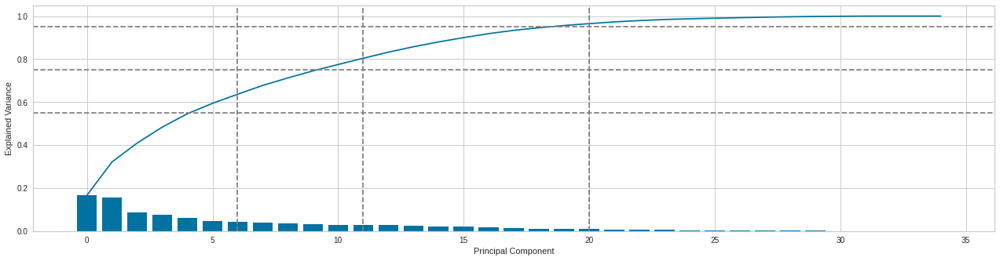

In [44]:
# Her bir temel bilesenin hesaba kattigi varyans arastirilir

fig = plt.figure(figsize=(17,4))

ax1 = fig.add_axes([0,0,1,1])
ax1.bar(range(len(pca.explained_variance_ratio_)), pca.explained_variance_ratio_)

ax2 = fig.add_axes([0,0,1,1])
ax2.plot(np.cumsum(pca.explained_variance_ratio_))

evalist = [0.55, 0.75, 0.95]
components_list = []

for eva in evalist:
    components = min(np.where(np.cumsum(pca.explained_variance_ratio_)>eva)[0]+1)
    ax1.axhline(eva, linestyle='dashed', color='grey')
    ax2.axvline(components, linestyle='dashed', color='grey')
    components_list.append(components)

plt.xlabel("Principal Component")
plt.ylabel("Explained Variance")

plt.show()

In [45]:
for eva, nc in zip(evalist, components_list):
    print(f'Minimum components için gerekli {int(eva*100)}% açiklanmis varyans: {nc}')

Minimum components için gerekli 55% açiklanmis varyans: 6
Minimum components için gerekli 75% açiklanmis varyans: 11
Minimum components için gerekli 95% açiklanmis varyans: 20


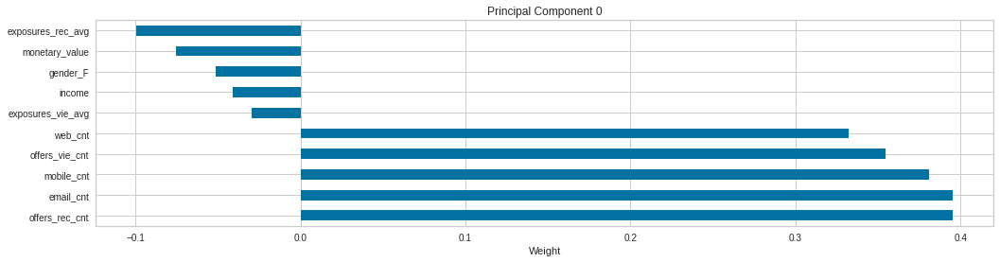

In [46]:
# Buradaki amac, temel bilesenlerin sayisini makul olcude kucuk tutarken, verilerdeki degiskenligin cogunu yakalamak icin yeterli bir yuzde kullanmaktir. 
#Ilk temel bileseni arastirilir
t.plot_pca_component(buyers, pca, 0)

In [47]:
#Ilk ana bilesen, buyuk olcude alinan teklif ortalamalari, musteriye ulasilan kanallarin sayisi ile ilgili ozelliklerle iliskilidir.

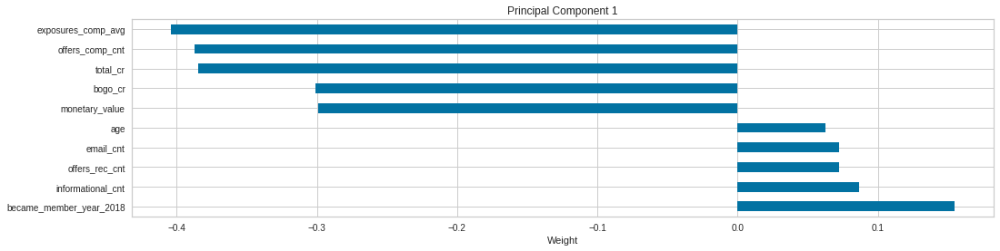

In [48]:
# Ikinci temel bilesen arastirilir
t.plot_pca_component(buyers, pca, 1)

In [49]:
#Ikinci temel bileşen, büyük oranda bir müşteri tarafından alınan tamamlanan teklif sayısı, 
#iletilen teklif sayilari ve musterilerin uye oldukları yillar ozellikle 2018 yilinda uye olan musterilerle alakalidir. 


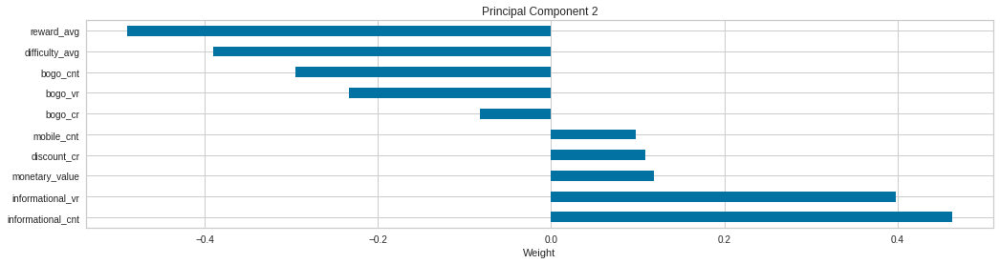

In [50]:
#Ucuncu temel bilesen arastirilmasi
t.plot_pca_component(buyers, pca, 2)

In [51]:
#Ucuncu temel bilesen teklifi tamamlamak icin verilen odul miktarlarinin ortalamasi ve teklifin tamamlanmasi icin gerekli minimum harcamaların ortalamalari ile ilgilidir.
#Ayrica musteri tekliflerinde bilgilendirme mesajları ile ilgilidir.

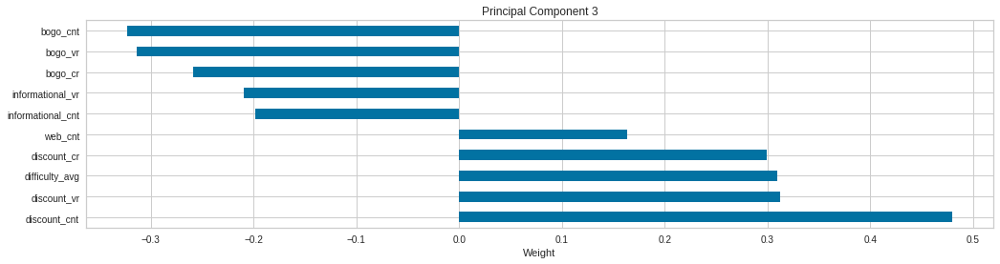

In [52]:
#Dorduncu temel bilesenin arastirilmasi
t.plot_pca_component(buyers, pca, 3)

In [53]:
#Dorduncu temel bilesen bogo(bir alana bir bedava) tekliflerinin sayisi ve indirim tekliflerinin miktari ile ilgilidir.

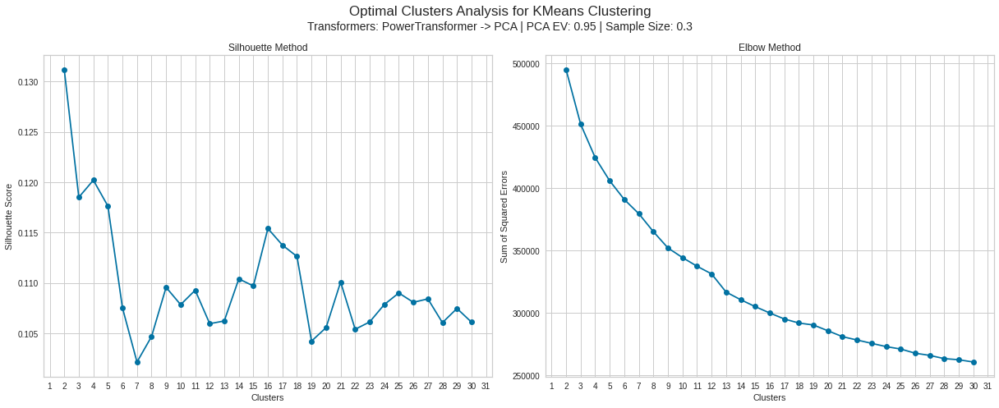

In [54]:
#Optimal Kume Sayisini Bulma
#Kume sayisinda SC ve SSE'deki degisikliklerin arastirilmasi
t.plot_optimization_analysis(
    df = buyers,
    ev = 0.95,
    sample_size = 0.3)

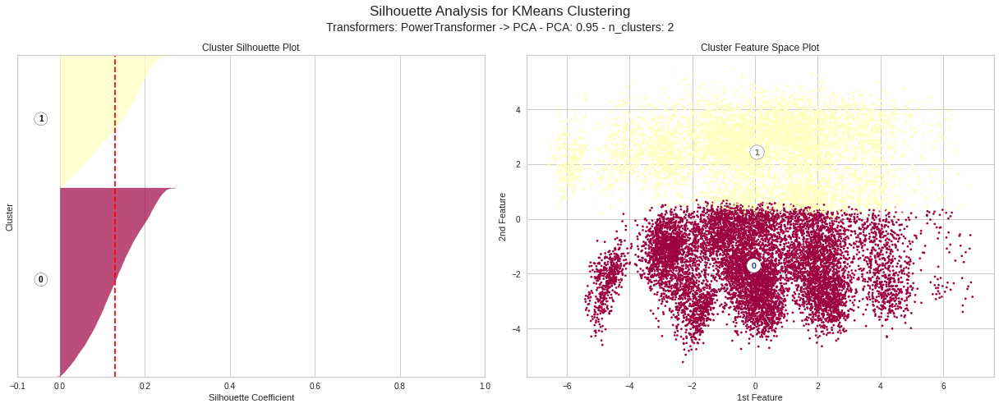

In [55]:
#Siluet analizi grafigi n_clusters=2 ile incelenir
t.plot_silhouette_analysis(
    df = buyers,
    ev = 0.95,
    n_clusters = 2)

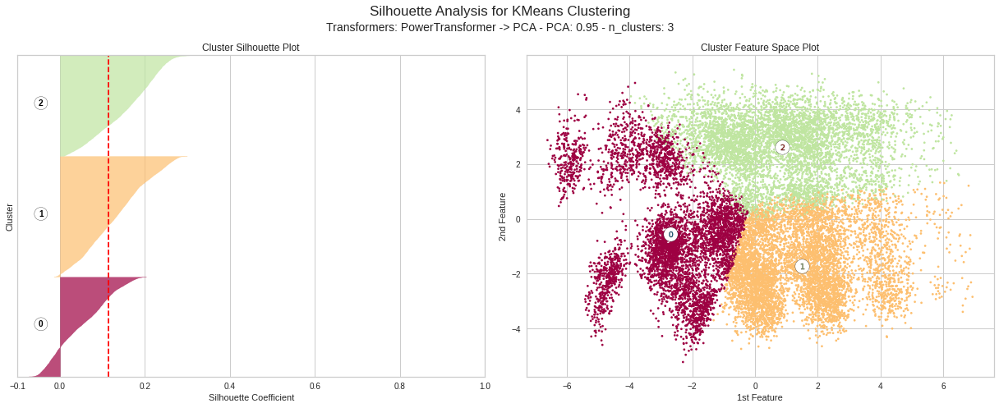

In [56]:
#Siluet analizi grafigi n_clusters=3 ile incelenir
t.plot_silhouette_analysis(
    df = buyers,
    ev = 0.95,
    n_clusters = 3)

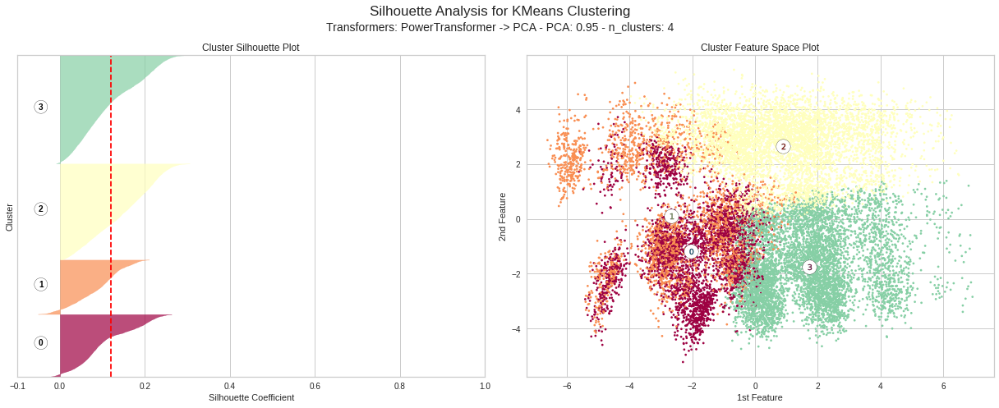

In [57]:
#Siluet analizi grafigi n_clusters=4 ile incelenir
t.plot_silhouette_analysis(
    df = buyers,
    ev = 0.95,
    n_clusters = 4)

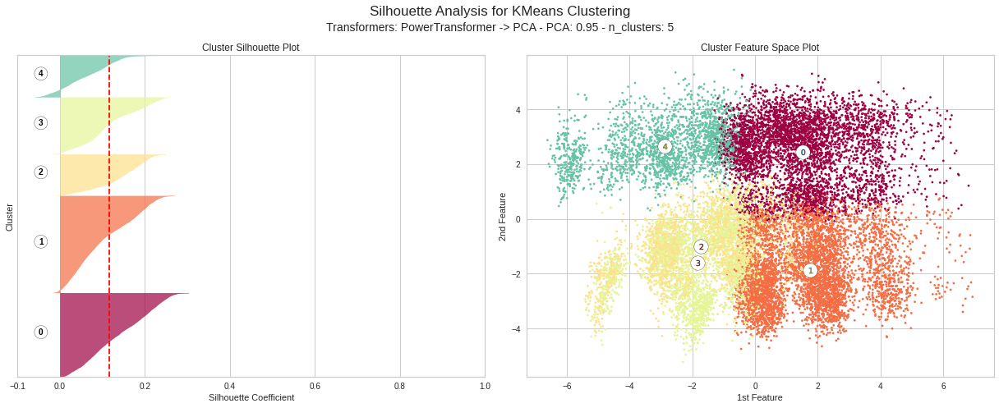

In [58]:
#Siluet analizi grafigi n_clusters=5 ile incelenir
t.plot_silhouette_analysis(
    df = buyers,
    ev = 0.95,
    n_clusters = 5)

In [59]:
#Ozellik olcekleme
scaler = StandardScaler().fit(buyers)
buyers_scaled = scaler.transform(buyers)
buyers_scaled.std(axis=0)[:5], buyers_scaled.mean(axis=0)[:5]

(array([1., 1., 1., 1., 1.]),
 array([-8.32880609e-17, -1.13536436e-16, -1.58068766e-17,  1.11750942e-16,
         6.09168667e-18]))

In [60]:
#Boyutsal kuculme
pca = PCA()
X_pca = pca.fit_transform(buyers_scaled)

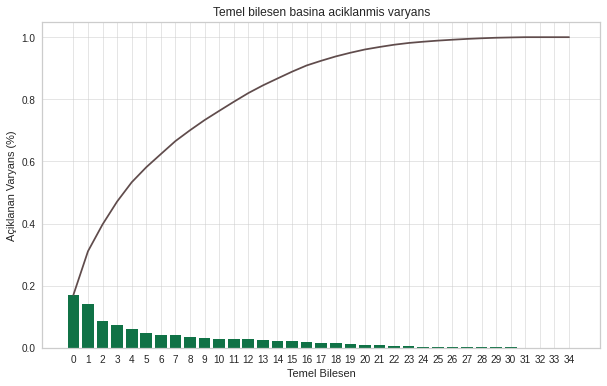

In [61]:
genders = ["#8700f9", "#00c4a9", "#4462D1"]
company_d = ["#cce6da", "#66b491", "#008248"]
company = ["#008248", "#604c4c", "#eac784", "#f0cddb", "#6B9997"]

# Scree plot grafigi cizilir. PCA'nın veriler uzerinde iyi calisip calismadigini kontrol etmek icin bir teshis aracidir.
components_n=len(pca.explained_variance_ratio_)
ind = np.arange(components_n)
vals = pca.explained_variance_ratio_
c_vals = np.cumsum(vals)

plt.figure(figsize=(10,6))

ax = sns.barplot(ind, vals, palette=company[:1], ci=None)
ax2 = sns.lineplot(ind, c_vals, color=company[1], ci=None)
ax.grid(b=True, which='major', linewidth=0.5)

ax.set_xlabel("Temel Bilesen")
ax.set_ylabel("Açiklanan Varyans (%)")
plt.title('Temel bilesen basina aciklanmis varyans');

In [62]:
expl_var_ratio = np.cumsum(pca.explained_variance_ratio_)
components_n = len(expl_var_ratio[expl_var_ratio <= 0.8])

#PCA yeniden calistirilir
pca = PCA(components_n).fit(buyers_scaled)
X_pca = pca.transform(buyers_scaled)
X_pca = pd.DataFrame(X_pca)
np.cumsum(pca.explained_variance_ratio_)

array([0.1701933 , 0.31079907, 0.3971574 , 0.47093588, 0.53290457,
       0.58134932, 0.62367072, 0.66553822, 0.70035008, 0.73309099,
       0.76269982, 0.79184803])

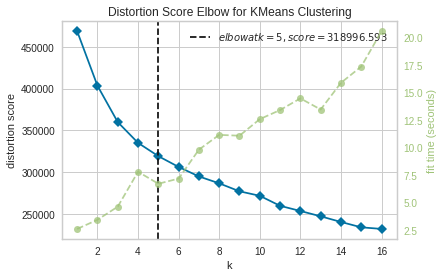

KElbowVisualizer(ax=<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>,
                 k=None, model=None)

In [63]:
#K-Means
# Dirsek Metoduna  olceklemeden sonra tekrar bakilir
kelbow_visualizer(KMeans(), X_pca, k=(1,17))

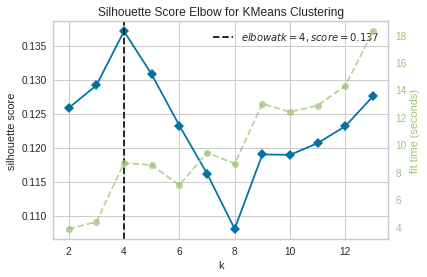

In [64]:
#siluet metodu
kelbow_visualizer(KMeans(), X_pca, k=(2,14), metric='silhouette');

In [65]:
from sklearn.metrics import  silhouette_score
model_k = KMeans(n_clusters = 4, random_state=60)
 
preds = model_k.fit_predict(X_pca)
siluet_avg = silhouette_score(X_pca, preds)
sse = model_k.inertia_

print(f"Siluet indexi {siluet_avg}")
print(f"SSE degeri {sse}")

Siluet indexi 0.13708089274891766
SSE degeri 334910.5337050821


/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning:

invalid value encountered in true_divide

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning:

invalid value encountered in double_scalars

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning:

invalid value encountered in true_divide

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning:

invalid value encountered in double_scalars

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning:

invalid value encountered in true_divide

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning:

invalid value encountered in double_scalars

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/

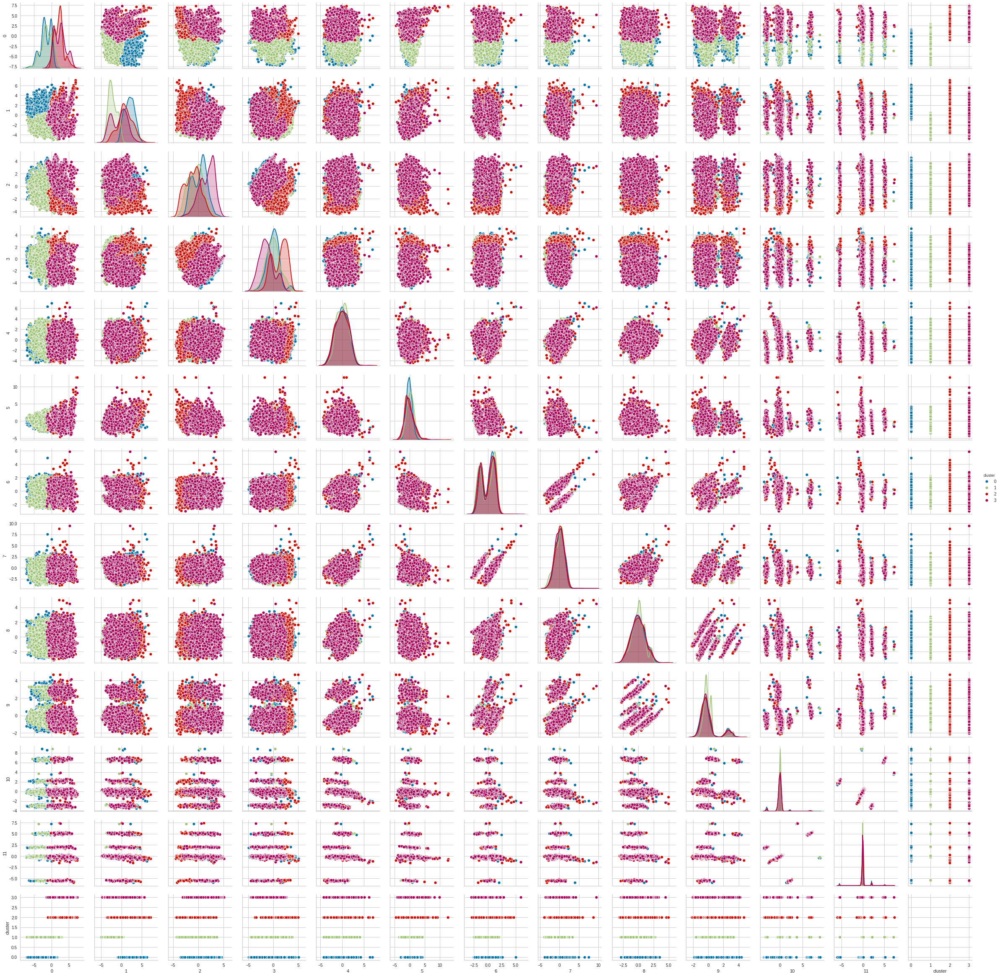

In [68]:
df = X_pca.copy()
df['cluster'] = preds
sns.pairplot(df, hue='cluster')

In [68]:
df = buyers.copy().reset_index()
df['cluster'] = preds
df = df.melt(id_vars=['person', 'cluster'])
df = df.query('cluster != -1').groupby(['cluster', 'variable']).mean().reset_index()
df.head()

,cluster,variable,value
0,0,age,60.630960
1,0,became_member_year_2013,0.014370
2,0,became_member_year_2014,0.041803
3,0,became_member_year_2015,0.117570
4,0,became_member_year_2016,0.239059


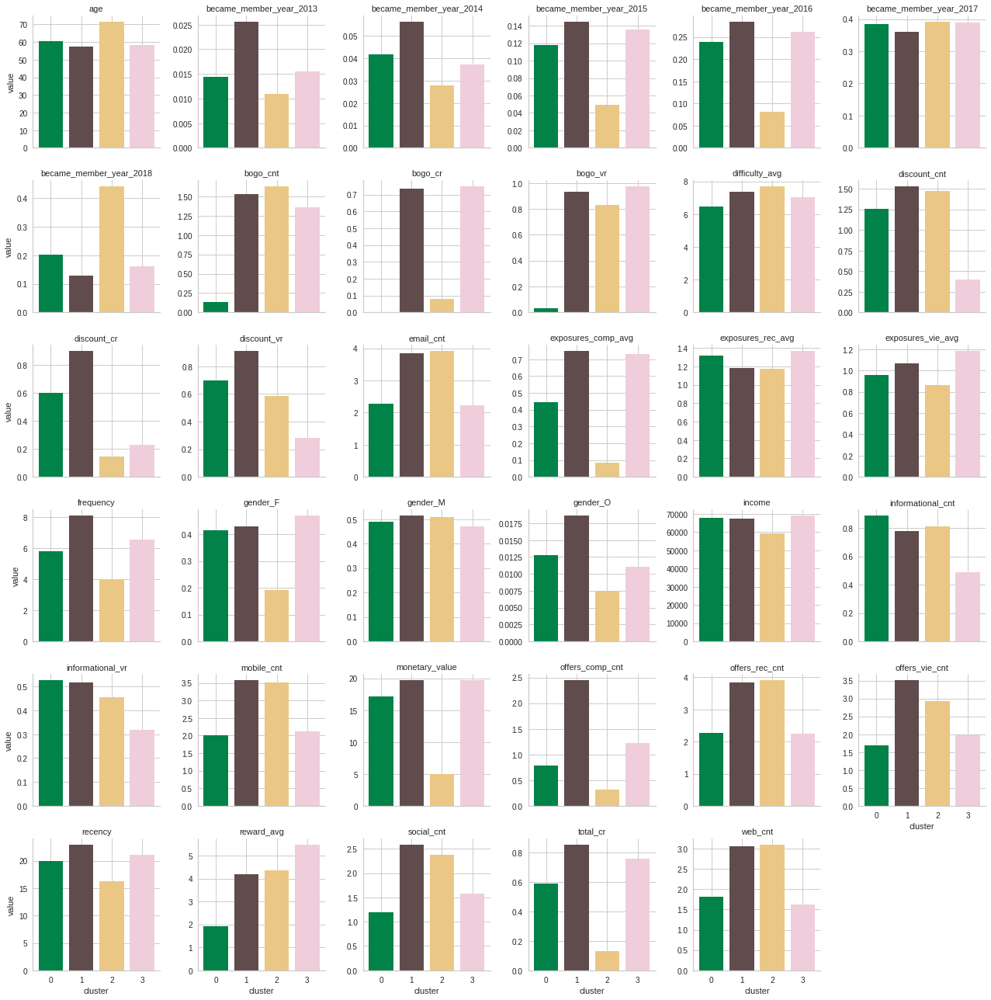

In [77]:
com = sns.FacetGrid(df, col='variable', hue='cluster', palette=company, col_wrap=6, height=3, sharey=False)
com = com.map(plt.bar, 'cluster', 'value').set_titles("{col_name}");


In [66]:
#OPTICS 
from sklearn.cluster import OPTICS
model = OPTICS(min_samples=40)
optics_clusters = model.fit_predict(X_pca)
siluet_ort = silhouette_score(X_pca, optics_clusters)
#sse = model.inertia_

#OPTICS yontemi modeli degerlendirirken Kmeans de olduğu gibi SSE metriginde dogru bir olcu degildir. Bu yuzden OPTICS'de SSE metrigi kullanilmaz. 
print(f"Siluet indexi {siluet_ort}")
#print(f"SSE değeri {sse}")

Siluet indexi 0.23901295308145726


In [67]:
print("Küme Sayisi:", len(np.unique(optics_clusters)))

Küme Sayisi: 4


/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning:

invalid value encountered in true_divide

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning:

invalid value encountered in double_scalars



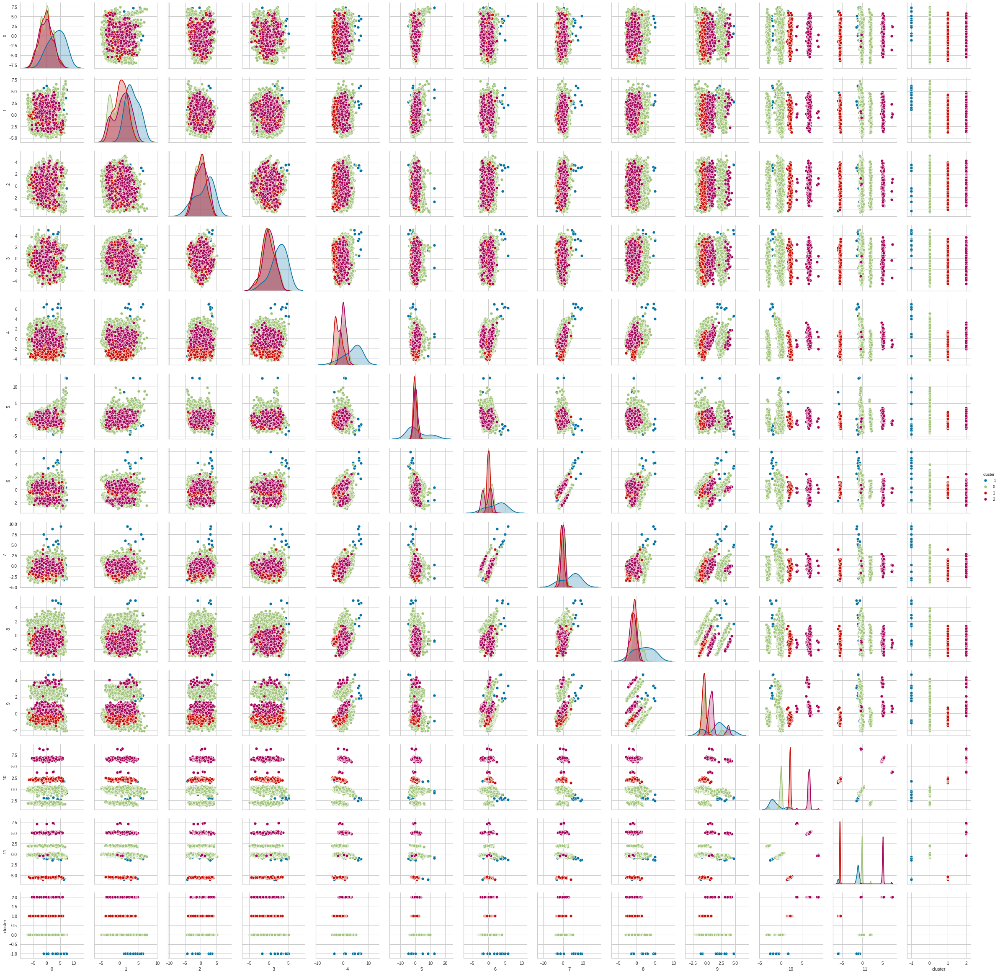

In [89]:
df = X_pca.copy()
df['cluster'] = optics_clusters
sns.pairplot(df, hue='cluster')

In [90]:
df = buyers.copy().reset_index()
df['cluster'] = optics_clusters
df = df.melt(id_vars=['person', 'cluster'])
df = df.query('cluster != -1').groupby(['cluster', 'variable']).mean().reset_index()
df.head()

,cluster,variable,value
0,0,age,62.789432
1,0,became_member_year_2013,0.000000
2,0,became_member_year_2014,0.041870
3,0,became_member_year_2015,0.109093
4,0,became_member_year_2016,0.211421


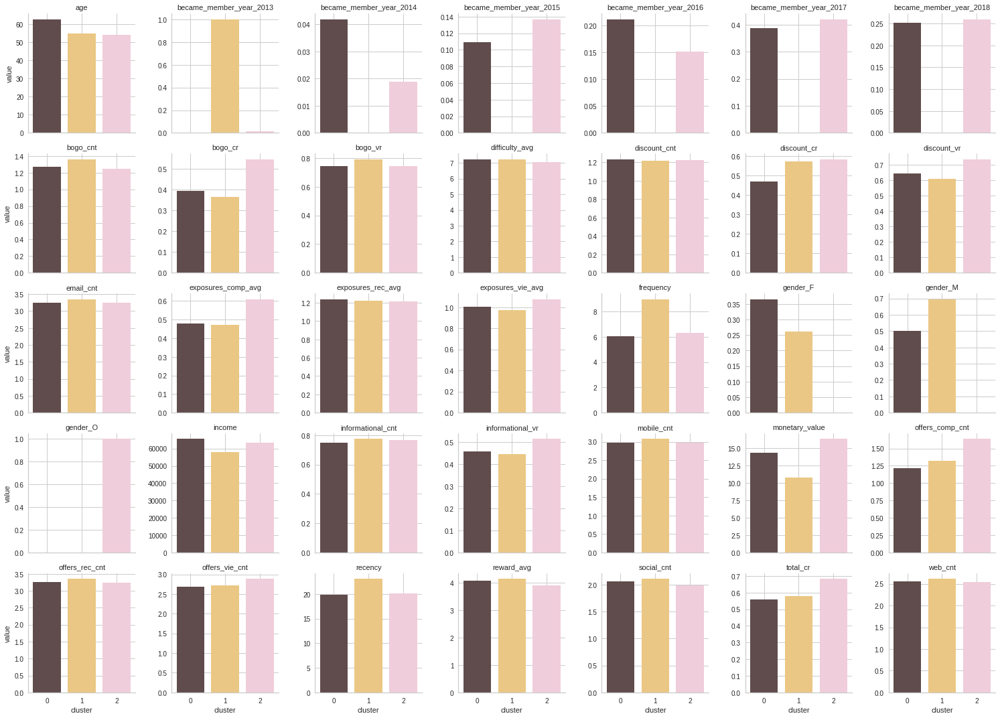

In [93]:
g = sns.FacetGrid(df, col='variable', hue='cluster', palette=company[1:], col_wrap=7, height=3, sharey=False)
g = g.map(plt.bar, 'cluster', 'value').set_titles("{col_name}")

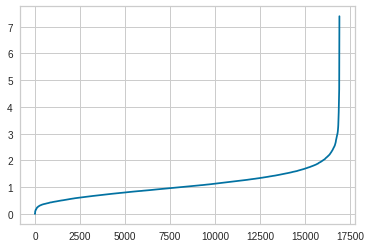

In [68]:
#DBSCAN
model_d = NearestNeighbors(n_neighbors=2)
nbrs = model_d.fit(X_pca)
distances, indices = nbrs.kneighbors(X_pca)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [77]:
#Siluet skoruna gore modelin degerlendirilmesi
#DBSCAN yontemi modeli degerlendirirken Kmeans de olduğu gibi SSE metriginde dogru bir olcu degildir. Bu yuzden DBSCAN'de SSE metrigi kullanilmaz. 
model =  DBSCAN(eps=4, min_samples=150)
dbscan_clusters = model.fit_predict(X_pca)
siluet_ortd = silhouette_score(X_pca, dbscan_clusters)
#sse = model.inertia_

print(f"Siluet indexi {siluet_ortd}")
#print(f"SSE değeri {sse}")

Siluet indexi 0.28647413758234225


In [75]:
print("Küme Sayisi:", len(np.unique(dbscan_clusters)))

Küme Sayisi: 6


/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning:

invalid value encountered in true_divide

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning:

invalid value encountered in double_scalars

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning:

invalid value encountered in true_divide

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning:

invalid value encountered in double_scalars

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning:

invalid value encountered in true_divide

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning:

invalid value encountered in double_scalars

/home/nbuser/anaconda3_501/lib/python3.6/site-packages/statsmodels/

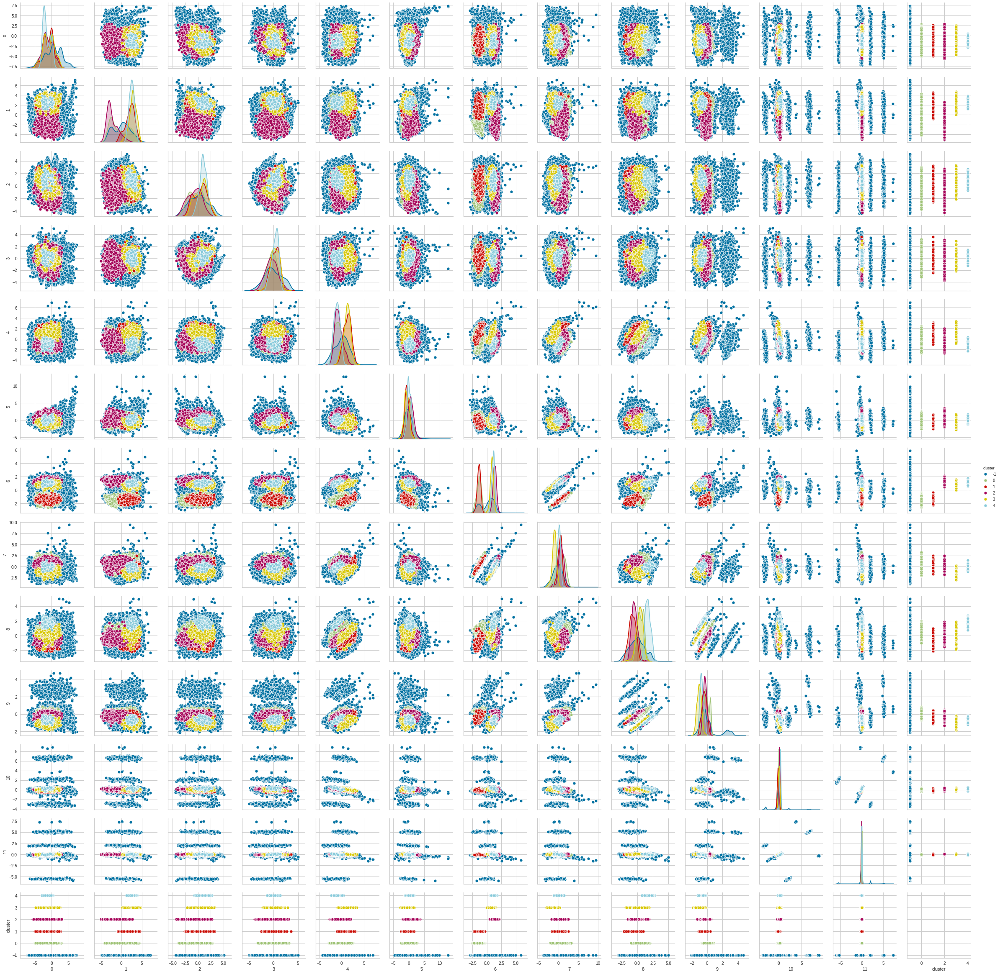

In [76]:
df = X_pca.copy()
df['cluster'] = dbscan_clusters
sns.pairplot(df, hue='cluster')